<a href="https://colab.research.google.com/github/wjoonkim/math5470_Kim/blob/main/math5470_kim_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MATH 5470 Project 1
## M5 Forecasting - Accuracy
Author: Won Joon Kim

This Jupyter notebook has been adapted from
- https://www.kaggle.com/code/anshuls235/time-series-forecasting-eda-fe-modelling
- https://www.kaggle.com/code/kevinfff/math5470-fan-m5accuracy

GitHub Copilot (Claude Sonnet 4.5) in Visual Studio Code was utilized throughout the notebook for code writing, and the outputs were analyzed by the author.

And, of course, I thank the creators and maintainers of the packages used in this notebook!

## 0. set up notebook

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import warnings
warnings.filterwarnings('ignore')
import joblib

In [ ]:
plt.rcParams['figure.dpi'] = 150

## 1. data wrangling

### 1.1 import datasets

model training and evaluation data

In [ ]:
sales = pd.read_csv('sales_train_evaluation.csv')
sales.name = 'sales'
display(sales)

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


In [ ]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1947 entries, id to d_1941
dtypes: int64(1941), object(6)
memory usage: 452.9+ MB


In [ ]:
sales['state_id'].unique()

array(['CA', 'TX', 'WI'], dtype=object)

dates on which the products are sold

In [ ]:
calendar = pd.read_csv('calendar.csv')
calendar.name = 'calendar'
display(calendar)

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0


looks like the `calendar` contains data until day 1969 (last row), but `sales` only contains until day 1941 (last column)

In [ ]:
#Add zero sales for the remaining days 1942-1969
for d in range(1942,1970):
    col = 'd_' + str(d)
    sales[col] = 0
    sales[col] = sales[col].astype(np.int16)
display(sales)

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,0,0,0,0,0,0,0,0,0,0
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,0,0,0,0,0,0,0,0
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


price of the products sold per store and date

In [ ]:
prices = pd.read_csv('sell_prices.csv')
prices.name = 'prices'
display(prices)

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26
...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.00
6841117,WI_3,FOODS_3_827,11618,1.00
6841118,WI_3,FOODS_3_827,11619,1.00
6841119,WI_3,FOODS_3_827,11620,1.00


### 1.2 downcast dataframes
to reduce the amount of storage used and expedite the operations

In [ ]:
sales_bd = np.round(sales.memory_usage().sum()/(1024*1024),1)
calendar_bd = np.round(calendar.memory_usage().sum()/(1024*1024),1)
prices_bd = np.round(prices.memory_usage().sum()/(1024*1024),1)

In [ ]:
def downcast(df):
    cols = df.dtypes.index.tolist()
    types = df.dtypes.values.tolist()
    for i,t in enumerate(types):
        if 'int' in str(t):
            if df[cols[i]].min() > np.iinfo(np.int8).min and df[cols[i]].max() < np.iinfo(np.int8).max:
                df[cols[i]] = df[cols[i]].astype(np.int8)
            elif df[cols[i]].min() > np.iinfo(np.int16).min and df[cols[i]].max() < np.iinfo(np.int16).max:
                df[cols[i]] = df[cols[i]].astype(np.int16)
            elif df[cols[i]].min() > np.iinfo(np.int32).min and df[cols[i]].max() < np.iinfo(np.int32).max:
                df[cols[i]] = df[cols[i]].astype(np.int32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.int64)
        elif 'float' in str(t):
            if df[cols[i]].min() > np.finfo(np.float16).min and df[cols[i]].max() < np.finfo(np.float16).max:
                df[cols[i]] = df[cols[i]].astype(np.float16)
            elif df[cols[i]].min() > np.finfo(np.float32).min and df[cols[i]].max() < np.finfo(np.float32).max:
                df[cols[i]] = df[cols[i]].astype(np.float32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.float64)
        elif t == object:
            if cols[i] == 'date':
                df[cols[i]] = pd.to_datetime(df[cols[i]], format='%Y-%m-%d')
            else:
                df[cols[i]] = df[cols[i]].astype('category')
    return df

In [ ]:
sales = downcast(sales)
sales

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


In [ ]:
prices = downcast(prices)
prices

In [ ]:
calendar = downcast(calendar)
calendar

In [ ]:
sales_ad = np.round(sales.memory_usage().sum()/(1024*1024),1)
calendar_ad = np.round(calendar.memory_usage().sum()/(1024*1024),1)
prices_ad = np.round(prices.memory_usage().sum()/(1024*1024),1)

we have been able to reduce `sales` & `prices` to less than 1/4th of their actual memory usage. `calendar` is already a small dataframe.

In [ ]:
dic = {'DataFrame':['sales','calendar','prices'],
       'Before downcasting':[sales_bd,calendar_bd,prices_bd],
       'After downcasting':[sales_ad,calendar_ad,prices_ad]}

memory = pd.DataFrame(dic)
display(memory)
# Melt the data for seaborn
memory_melted = pd.melt(memory, id_vars='DataFrame', var_name='Status', value_name='Memory (MB)')
display(memory_melted)

,DataFrame,Before downcasting,After downcasting
0,sales,454.5,97.1
1,calendar,0.2,0.1
2,prices,208.8,45.8


,DataFrame,Status,Memory (MB)
0,sales,Before downcasting,454.5
1,calendar,Before downcasting,0.2
2,prices,Before downcasting,208.8
3,sales,After downcasting,97.1
4,calendar,After downcasting,0.1
5,prices,After downcasting,45.8


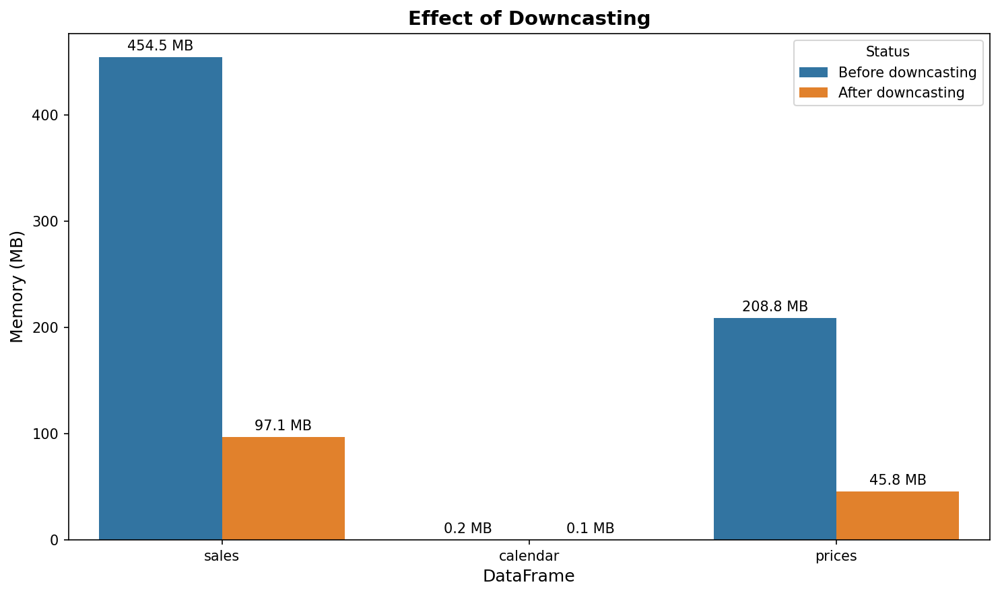

In [ ]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(data=memory_melted, x='DataFrame', y='Memory (MB)', hue='Status', ax=ax)

# Add value labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f MB', padding=3)

# Customize the plot
ax.set_title('Effect of Downcasting', fontsize=14, fontweight='bold')
ax.set_xlabel('DataFrame', fontsize=12)
ax.set_ylabel('Memory (MB)', fontsize=12)
plt.legend(title='Status', loc='upper right')
plt.tight_layout()
plt.show()

### 1.3 melt dataframes
Currently, the data is in three dataframes: `sales`, `prices` & `calendar`. The `sales` dataframe contains daily sales data with days(d_1 - d_1969) as columns. The `prices` dataframe contains items' price details and `calendar` contains data about the days d.  


Convert from wide to long format i.e., make d_1969 rows for the same id

In [ ]:
sales

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,0,0,0,0,0,0,0,0,0,0
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,0,0,0,0,0,0,0,0
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# melt and drop rows with NaN
df = pd.melt(sales, id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], var_name='d', value_name='sold').dropna()
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,d_1969,0
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,d_1969,0
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,d_1969,0
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,d_1969,0


Combine price data from prices dataframe and days data from calendar dataset

In [ ]:
df = pd.merge(df, calendar, on='d', how='left')
df = pd.merge(df, prices, on=['store_id','item_id','wm_yr_wk'], how='left')
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.980469
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.480469
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.980469
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.280273


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60034810 entries, 0 to 60034809
Data columns (total 22 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            category      
 1   item_id       category      
 2   dept_id       category      
 3   cat_id        category      
 4   store_id      category      
 5   state_id      category      
 6   d             object        
 7   sold          int16         
 8   date          datetime64[ns]
 9   wm_yr_wk      int16         
 10  weekday       category      
 11  wday          int8          
 12  month         int8          
 13  year          int16         
 14  event_name_1  category      
 15  event_type_1  category      
 16  event_name_2  category      
 17  event_type_2  category      
 18  snap_CA       int8          
 19  snap_TX       int8          
 20  snap_WI       int8          
 21  sell_price    float16       
dtypes: category(11), datetime64[ns](1), float16(1), int16(3), int8(5

In [ ]:
df['state_id'].unique()

[CA, TX, WI]
Categories (3, object): [CA, TX, WI]

this df is now "complete" for us to explore

## 2. exploratory data analysis


The M5 dataset involves the unit sales of various products sold in the USA, organized in the form of grouped time series. More specifically, the dataset involves the unit sales of 3,049 products, classified in 3 product categories (Hobbies, Foods, and Household) and 7 product departments, in which the above-mentioned categories are disaggregated.  The products are sold across ten stores, located in three States (CA, TX, and WI).

<img src='https://i.imgur.com/Ae5QBi9.png' style="width:500px;height:300px;">

### 2.1 distribution of items across different aggregation levels

In [ ]:
group = sales.groupby(['state_id','store_id','cat_id','dept_id'],as_index=False)['item_id'].count().dropna()
group['USA'] = 'United States of America'
group.rename(columns={'state_id':'State','store_id':'Store','cat_id':'Category','dept_id':'Department','item_id':'Count'},inplace=True)
# Filter out rows where Count is zero
# group = group[group['Count'] > 0]
display(group)

,State,Store,Category,Department,Count,USA
0,CA,CA_1,FOODS,FOODS_1,216,United States of America
1,CA,CA_1,FOODS,FOODS_2,398,United States of America
2,CA,CA_1,FOODS,FOODS_3,823,United States of America
3,CA,CA_1,FOODS,HOBBIES_1,0,United States of America
4,CA,CA_1,FOODS,HOBBIES_2,0,United States of America
...,...,...,...,...,...,...
625,WI,WI_3,HOUSEHOLD,FOODS_3,0,United States of America
626,WI,WI_3,HOUSEHOLD,HOBBIES_1,0,United States of America
627,WI,WI_3,HOUSEHOLD,HOBBIES_2,0,United States of America
628,WI,WI_3,HOUSEHOLD,HOUSEHOLD_1,532,United States of America


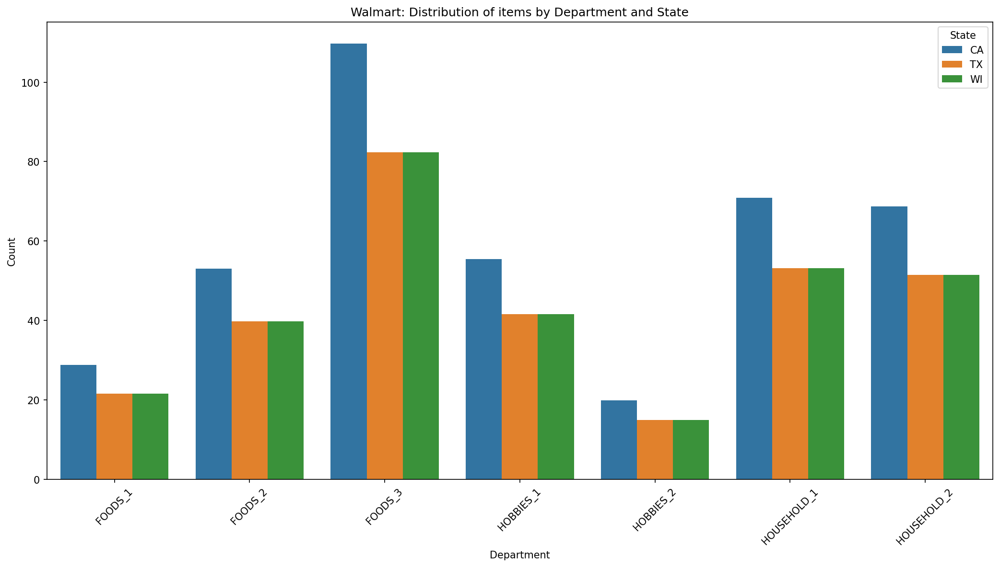

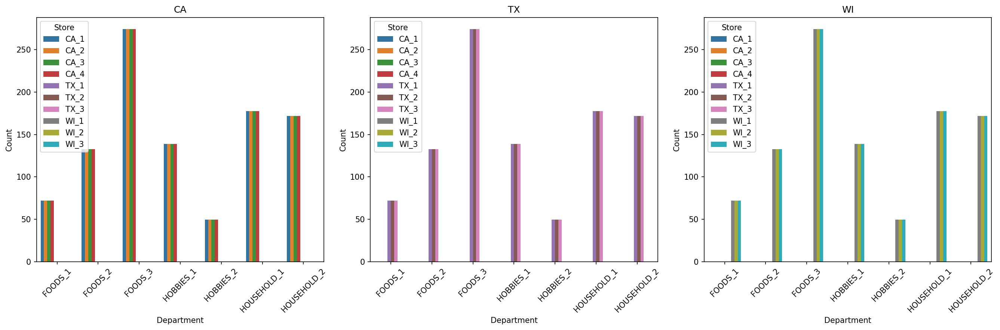

In [ ]:
# Create a categorical plot with hierarchical structure
fig, ax = plt.subplots(figsize=(14, 8))

# Create a hierarchical bar plot
sns.barplot(data=group, x='Department', y='Count', hue='State', ax=ax, errorbar=None)
ax.set_title('Walmart: Distribution of items by Department and State')
ax.set_xlabel('Department')
ax.set_ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Alternative: Create separate plots for each state
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
states = group['State'].unique()

for idx, state in enumerate(states):
    state_data = group[group['State'] == state]
    sns.barplot(data=state_data, x='Department', y='Count', hue='Store', ax=axes[idx], errorbar=None)
    axes[idx].set_title(f'{state}')
    axes[idx].set_xlabel('Department')
    axes[idx].set_ylabel('Count')
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### 2.2 item prices and their distribution

note the prices vary weekly $\rightarrow$ to study the distribution of prices, take their average.

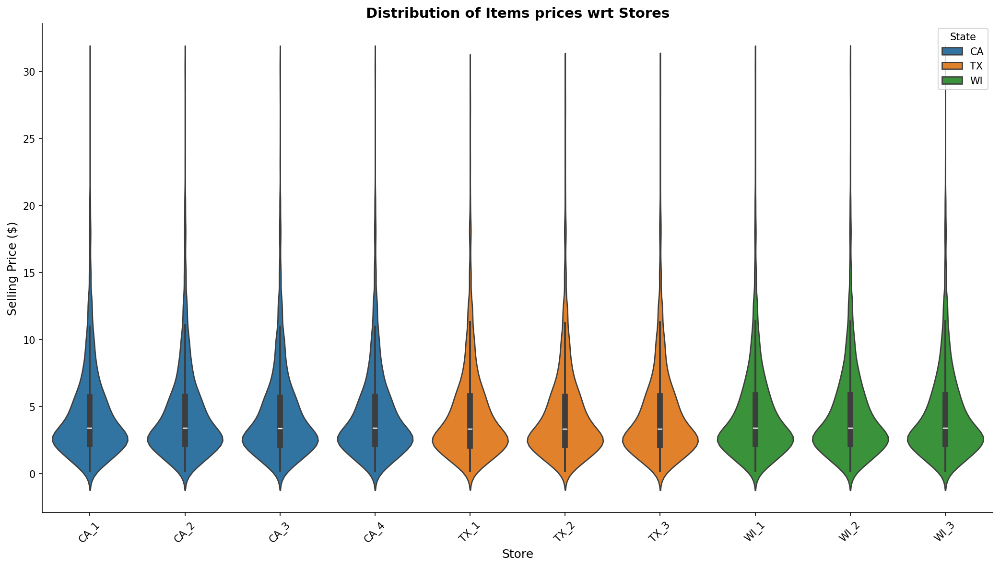

In [ ]:
group_price_store = df.groupby(['state_id','store_id','item_id'],as_index=False)['sell_price'].mean().dropna()
# Create violin plot with seaborn
fig, ax = plt.subplots(figsize=(14, 8))
sns.violinplot(data=group_price_store, x='store_id', y='sell_price', hue='state_id',
               split=False, inner='box', ax=ax)

# Customize the plot
ax.set_xlabel('Store', fontsize=12)
ax.set_ylabel('Selling Price ($)', fontsize=12)
ax.set_title('Distribution of Items prices wrt Stores', fontsize=14, fontweight='bold')
plt.legend(title='State', loc='best')
plt.xticks(rotation=45)
plt.tight_layout()
sns.despine()
plt.show()

The distribution of item prices is almost uniform for all the stores across Califoria, Texas and Wisconsin

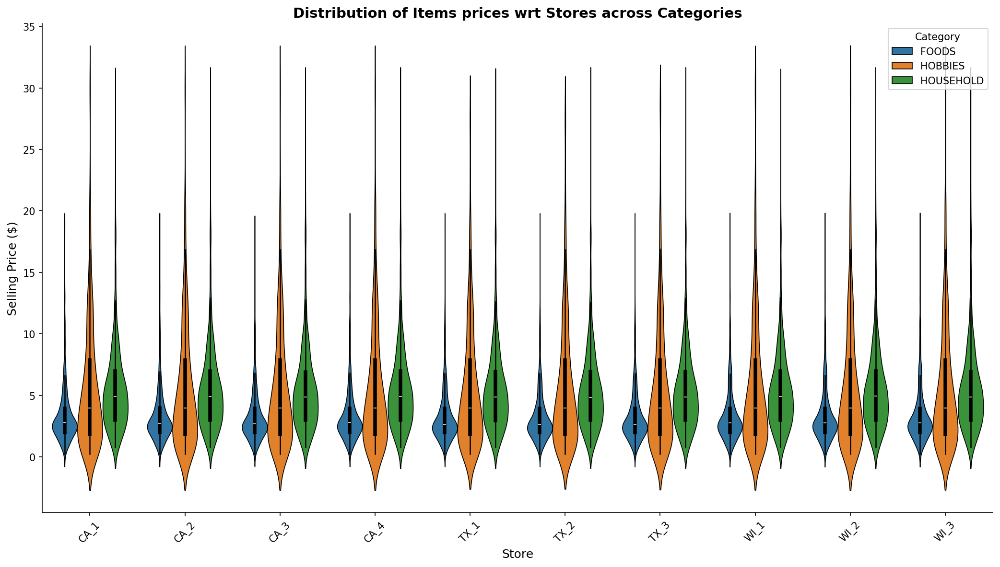

In [ ]:
group_price_cat = df.groupby(['store_id','cat_id','item_id'],as_index=False)['sell_price'].mean().dropna()

# Create violin plot with seaborn
fig, ax = plt.subplots(figsize=(14, 8))
sns.violinplot(data=group_price_cat, x='store_id', y='sell_price', hue='cat_id',
               split=False, inner='box', ax=ax, edgecolor='black', linewidth=0.8)

# Customize the plot
ax.set_xlabel('Store', fontsize=12)
ax.set_ylabel('Selling Price ($)', fontsize=12)
ax.set_title('Distribution of Items prices wrt Stores across Categories', fontsize=14, fontweight='bold')
plt.legend(title='Category', loc='best')
plt.xticks(rotation=45)
plt.tight_layout()
sns.despine()
plt.show()

As can be seen from the plot above,
- food category items are quite cheap as compared with hobbies and household items.
- hobbies and household items have almost the same price range.
- household items have the largest median price.

### 2.3 items sold

In [ ]:
group = df.groupby(['year','date','state_id','store_id'], as_index=False)['sold'].sum().dropna()
display(group)

,year,date,state_id,store_id,sold
0,2011,2011-01-29,CA,CA_1,4337
1,2011,2011-01-29,CA,CA_2,3494
2,2011,2011-01-29,CA,CA_3,4739
3,2011,2011-01-29,CA,CA_4,1625
4,2011,2011-01-29,CA,TX_1,0
...,...,...,...,...,...
354415,2016,2016-06-19,WI,TX_2,0
354416,2016,2016-06-19,WI,TX_3,0
354417,2016,2016-06-19,WI,WI_1,0
354418,2016,2016-06-19,WI,WI_2,0


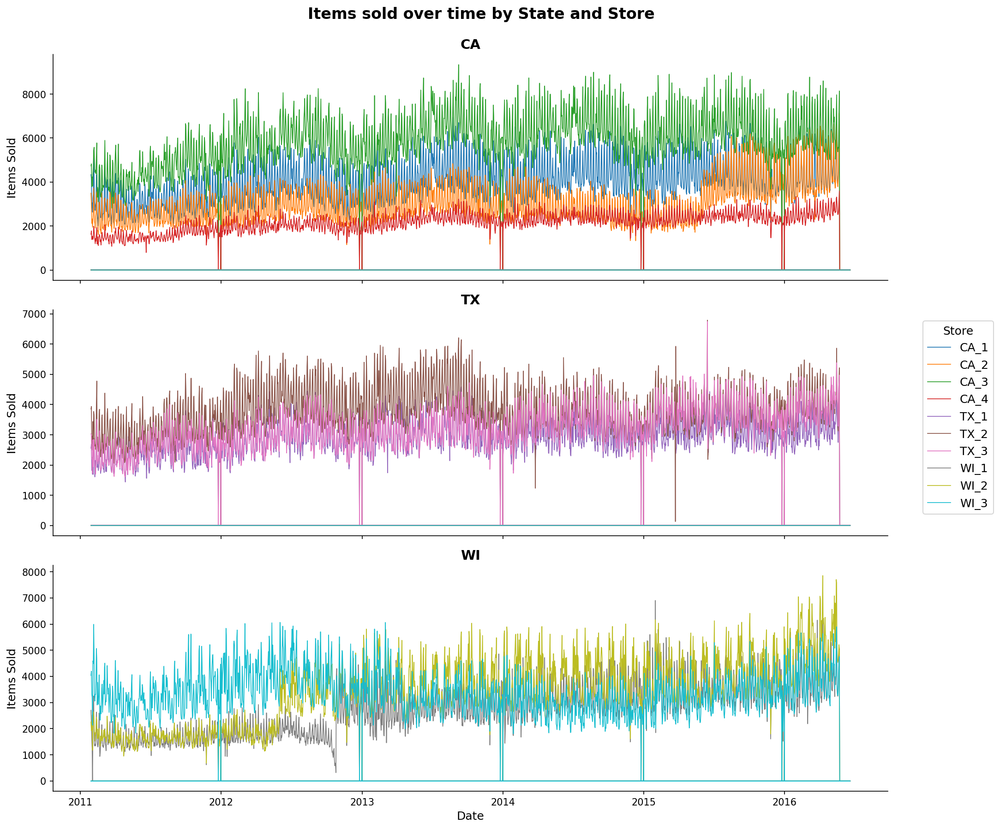

In [ ]:
# Create subplots - one for each state
fig, axes = plt.subplots(3, 1, figsize=(14, 12), sharex=True)
states = ['CA', 'TX', 'WI']
colors = plt.cm.tab10(range(10))  # Get distinct colors for stores

# Store handles and labels for single legend
all_handles = []
all_labels = []

for idx, state in enumerate(states):
    ax = axes[idx]
    state_data = group[group['state_id'] == state]

    # Plot each store in this state
    for store_idx, store in enumerate(state_data['store_id'].unique()):
        store_data = state_data[state_data['store_id'] == store]
        line, = ax.plot(store_data['date'], store_data['sold'],
                       label=store, linewidth=0.8, color=colors[store_idx])

        # Collect handles and labels only from first state to avoid duplicates
        if idx == 0:
            all_handles.append(line)
            all_labels.append(store)

    # Customize subplot
    ax.set_ylabel('Items Sold', fontsize=12)
    ax.set_title(f'{state}', fontsize=14, fontweight='bold')

# Set common x-axis label
axes[2].set_xlabel('Date', fontsize=12)
fig.suptitle('Items sold over time by State and Store', fontsize=16, fontweight='bold', y=0.995)

# Create single legend outside to the right
fig.legend(all_handles, all_labels, loc='center left', bbox_to_anchor=(0.95, 0.5),
          fontsize=12, title='Store', title_fontsize=12)

plt.tight_layout()
plt.subplots_adjust(right=0.92)  # Make room for legend
sns.despine()
plt.show()

### 2.4 state-wise analysis

In [ ]:
df['revenue'] = df['sold']*df['sell_price'].astype(np.float32)
display(df)

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,revenue
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,2011,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,2011,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,2011,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,2011,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,2011,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.980469,0.0
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.480469,0.0
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.980469,0.0
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.280273,0.0


In [ ]:
cal_data = group.copy()
cal_data = cal_data[cal_data.date <= '2016-05-22']
cal_data['week'] = cal_data.date.dt.isocalendar().week
cal_data['day_name'] = cal_data.date.dt.day_name()

In [ ]:
def calmap(cal_data, state, store, cmap='viridis'):
    """
    Create a calendar heatmap showing sales by day of week and week number

    Parameters:
    -----------
    cal_data : DataFrame
        Data with columns: state_id, store_id, year, week, day_name, sold
    state : str
        State identifier (e.g., 'CA', 'TX', 'WI')
    store : str
        Store identifier (e.g., 'CA_1', 'TX_1', etc.)
    cmap : str
        Matplotlib colormap name (default: 'viridis')
    """
    # Filter data
    cal_data = cal_data[(cal_data['state_id']==state)&(cal_data['store_id']==store)].copy()
    years = sorted(cal_data.year.unique().tolist())

    # Create figure with subplots (one per year)
    fig, axes = plt.subplots(len(years), 1, figsize=(16, 12),
                             sharex=True, sharey=True)

    # Handle single year case
    if len(years) == 1:
        axes = [axes]

    # Day order for y-axis
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    for idx, year in enumerate(years):
        ax = axes[idx]
        year_data = cal_data[cal_data['year']==year].copy()

        # Pivot data to create heatmap format
        heatmap_data = year_data.pivot_table(
            index='day_name',
            columns='week',
            values='sold',
            aggfunc='sum'
        )

        # Reorder days
        heatmap_data = heatmap_data.reindex(day_order)

        # Create heatmap
        sns.heatmap(heatmap_data, ax=ax, cmap=cmap,
                   cbar_kws={'label': 'Items Sold'},
                   linewidths=0.5, linecolor='white')

        # Customize
        ax.set_ylabel(str(year), fontsize=10, fontweight='bold')
        ax.set_xlabel('')
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

        # Only show x-label on bottom plot
        if idx == len(years) - 1:
            ax.set_xlabel('Week Number', fontsize=10)

    fig.suptitle(f'{store} - Calendar Heatmap', fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()

    return fig

In [ ]:
cal_data

,year,date,state_id,store_id,sold,week,day_name
0,2011,2011-01-29,CA,CA_1,4337,4,Saturday
1,2011,2011-01-29,CA,CA_2,3494,4,Saturday
2,2011,2011-01-29,CA,CA_3,4739,4,Saturday
3,2011,2011-01-29,CA,CA_4,1625,4,Saturday
4,2011,2011-01-29,CA,TX_1,0,4,Saturday
...,...,...,...,...,...,...,...
353575,2016,2016-05-22,WI,TX_2,0,20,Sunday
353576,2016,2016-05-22,WI,TX_3,0,20,Sunday
353577,2016,2016-05-22,WI,WI_1,5054,20,Sunday
353578,2016,2016-05-22,WI,WI_2,5068,20,Sunday


#### California

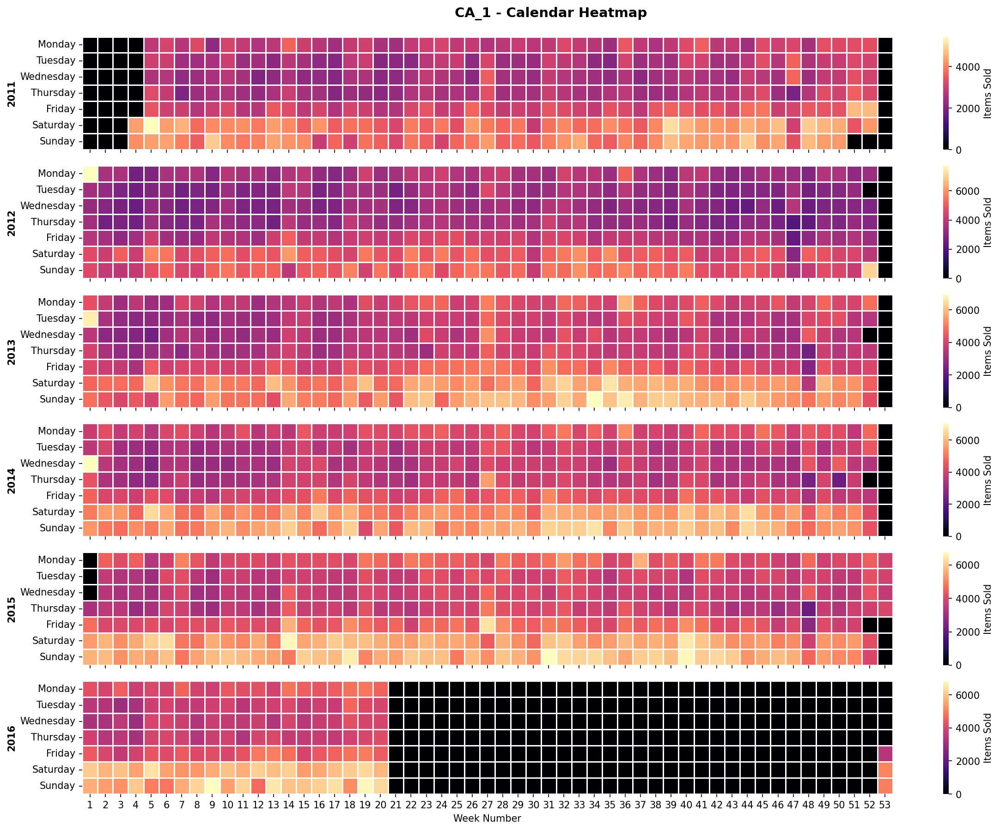

In [ ]:
fig = calmap(cal_data, state='CA', store='CA_1', cmap='magma')
fig.show()

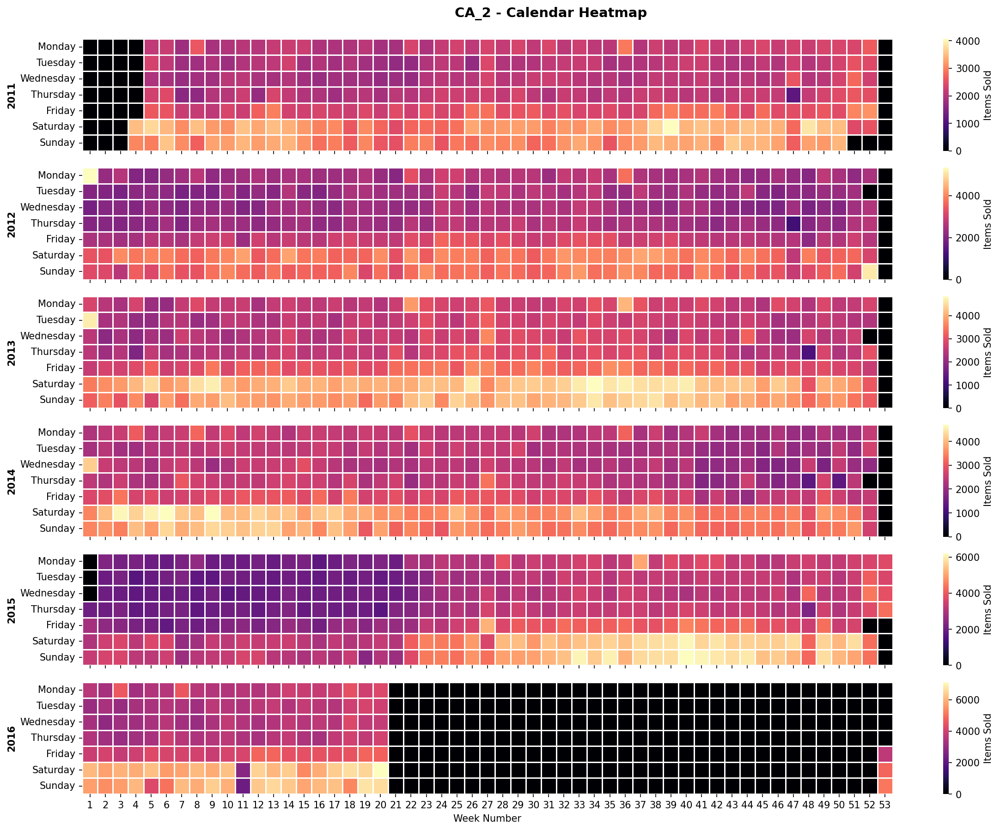

In [ ]:
fig = calmap(cal_data, 'CA', 'CA_2', 'magma')
fig.show()

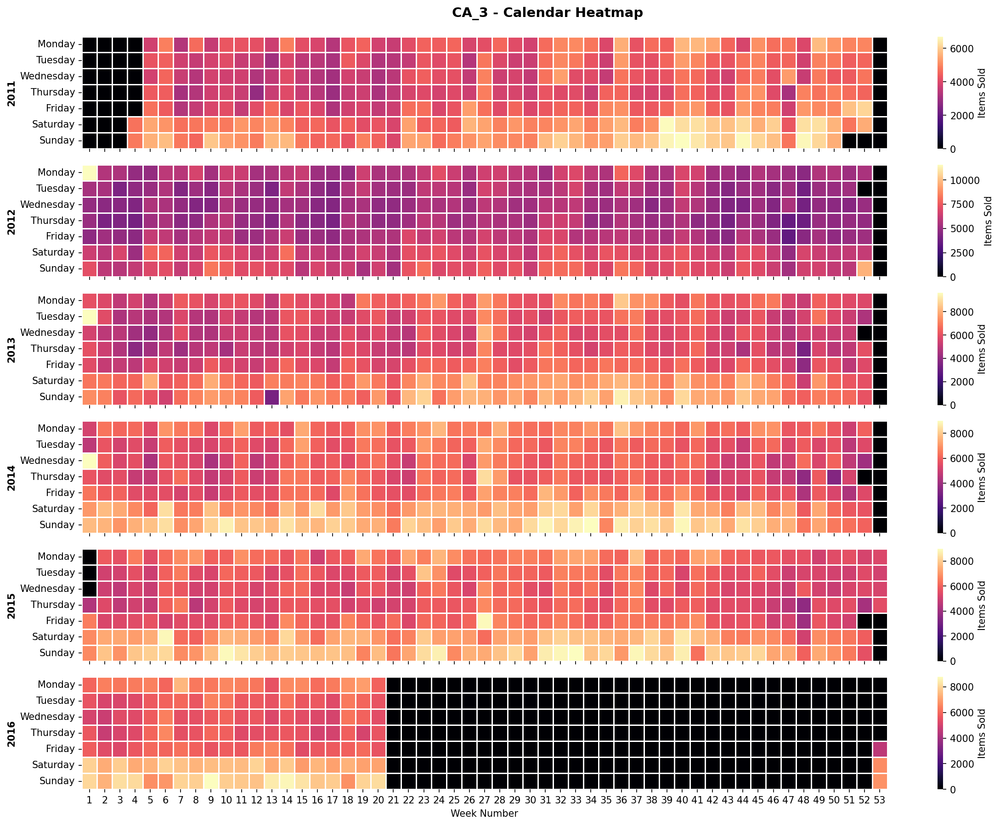

In [ ]:
fig = calmap(cal_data, 'CA', 'CA_3', 'magma')
fig.show()

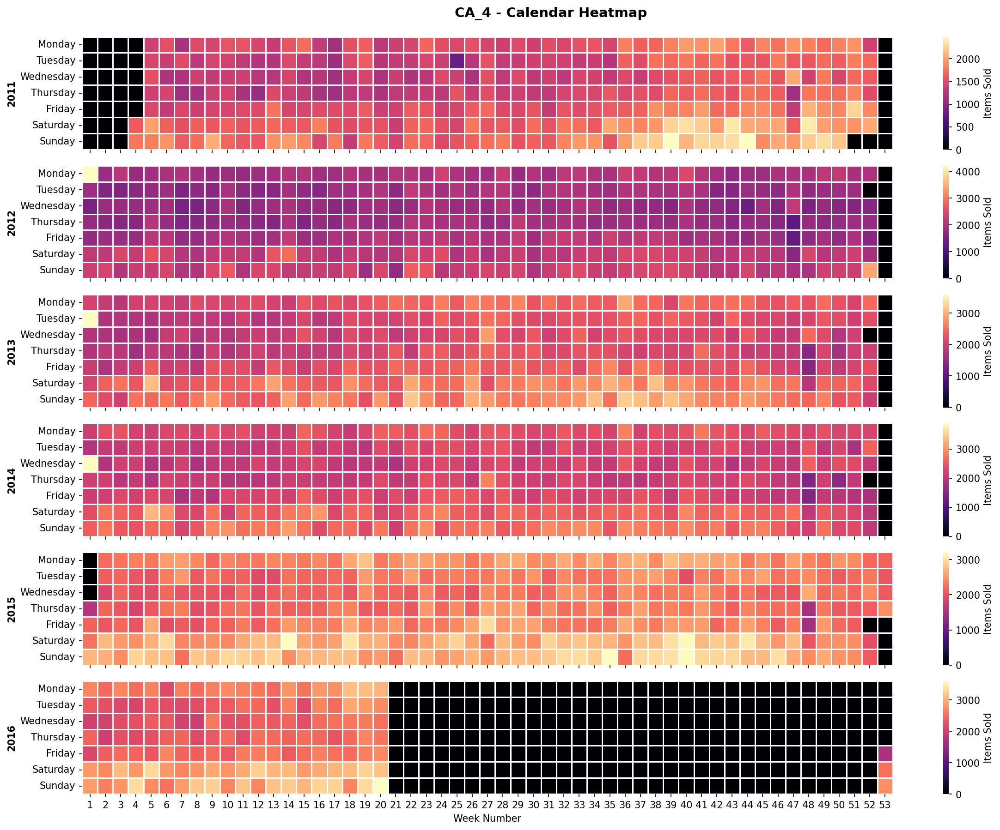

In [ ]:
fig = calmap(cal_data, 'CA', 'CA_4', 'magma')
fig.show()

#### Texas

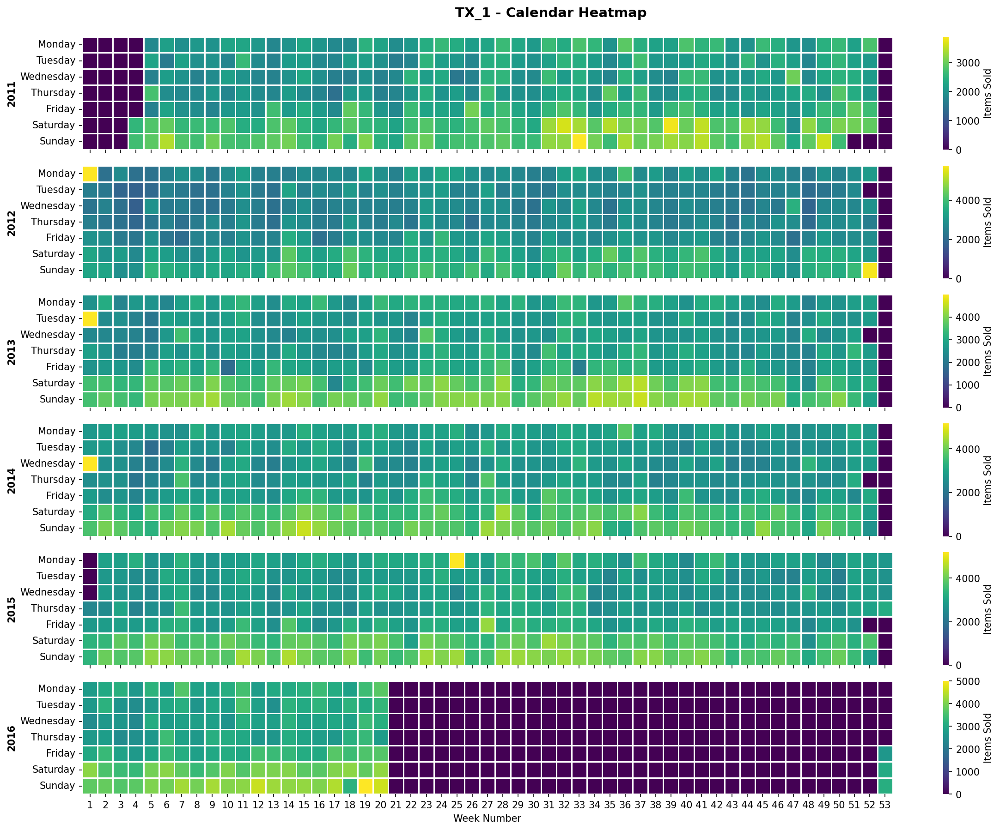

In [ ]:
fig = calmap(cal_data, 'TX', 'TX_1', 'viridis')
fig.show()

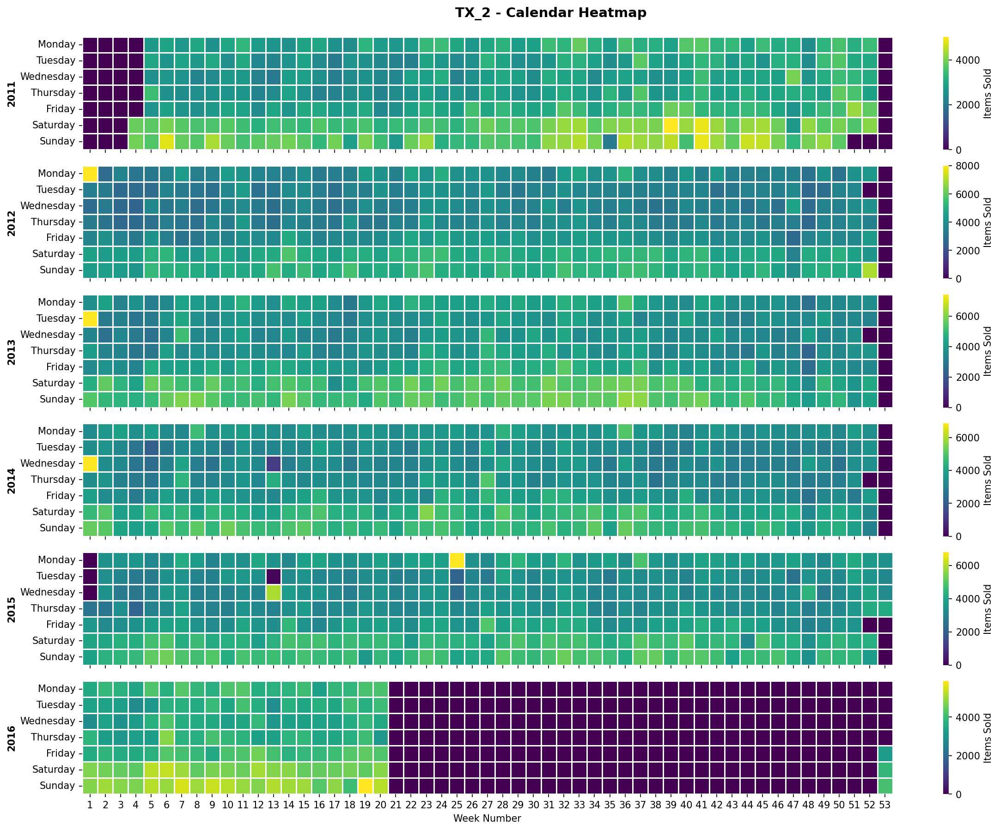

In [ ]:
fig = calmap(cal_data, 'TX', 'TX_2', 'viridis')
fig.show()

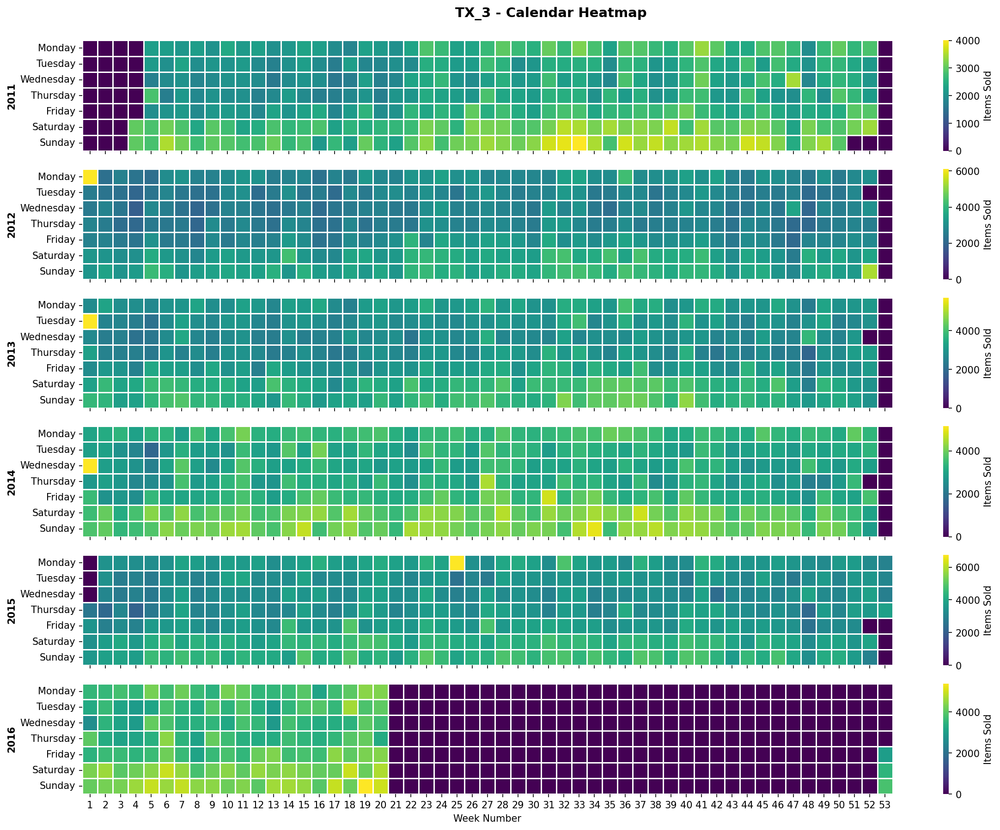

In [ ]:
fig = calmap(cal_data, 'TX', 'TX_3', 'viridis')
fig.show()

#### Wisconsin

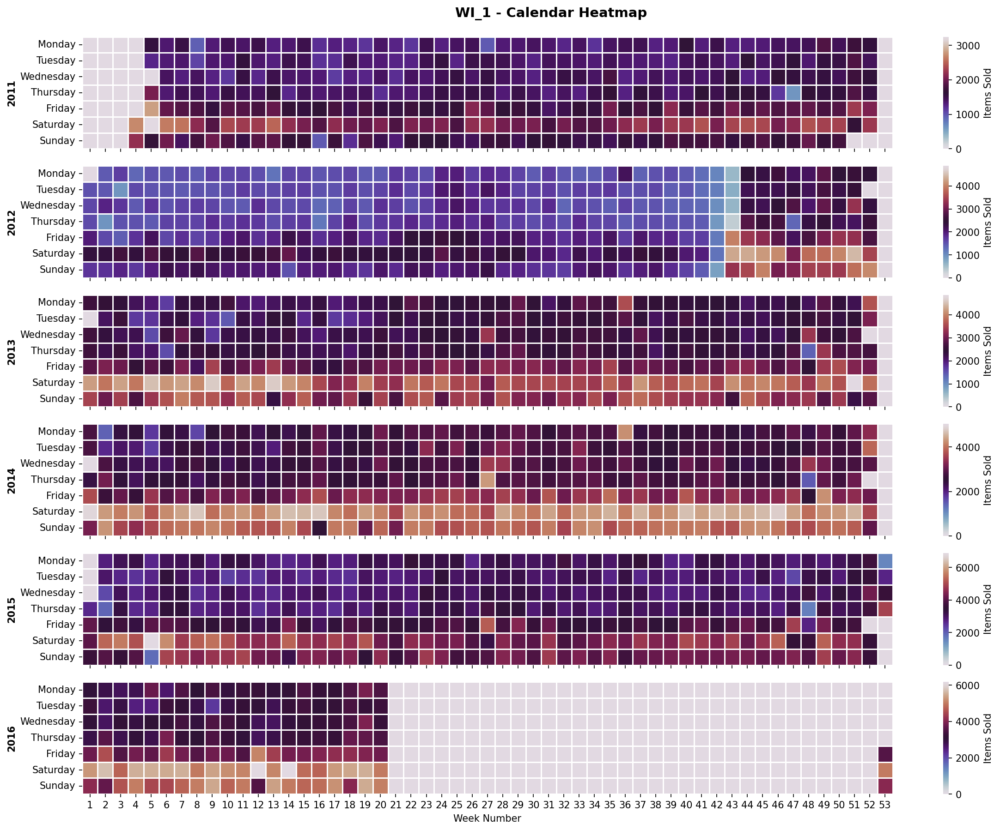

In [ ]:
fig = calmap(cal_data, 'WI', 'WI_1', 'twilight')
fig.show()

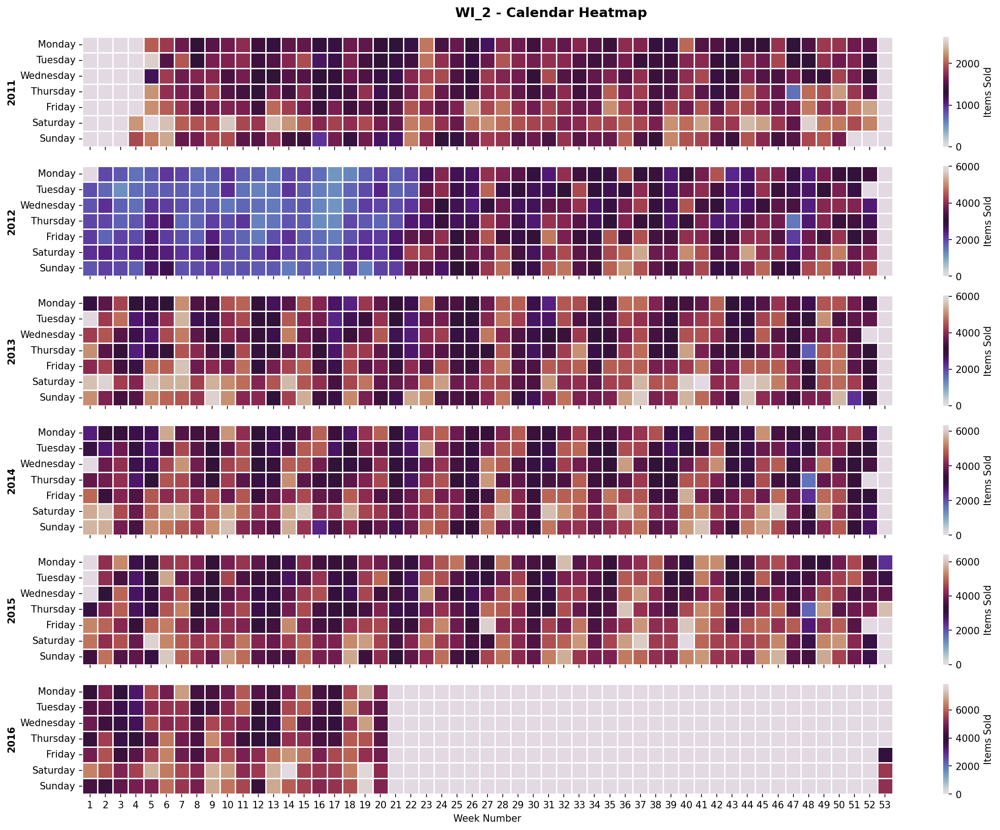

In [ ]:
fig = calmap(cal_data, 'WI', 'WI_2', 'twilight')
fig.show()

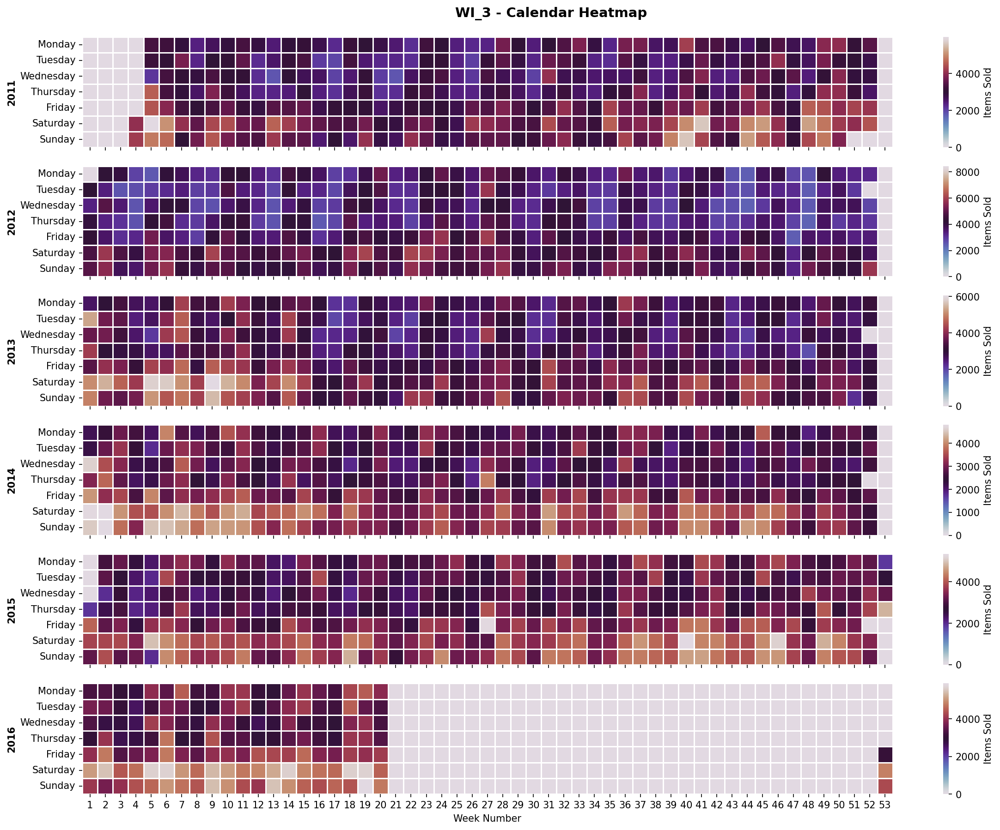

In [ ]:
fig = calmap(cal_data, 'WI', 'WI_3', 'twilight')
fig.show()

## 3.  modeling with lightgbm

### data wrangling

In [ ]:
sales = pd.read_csv('sales_train_evaluation.csv')
calendar = pd.read_csv('calendar.csv')
prices = pd.read_csv('sell_prices.csv')

In [ ]:
print(sales.shape)
sales.head(10)

(30490, 1947)


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,...,d_1917,d_1918,d_1919,d_1920,d_1921,d_1922,d_1923,d_1924,d_1925,d_1926,d_1927,d_1928,d_1929,d_1930,d_1931,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,0,3,5,0,0,1,1,0,2,1,2,2,1,0,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,2,1,0,0,0,0,2,1,3,0,0,1,0,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,4,1,6,4,0,0,0,2,2,4,2,1,1,1,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,1,0,3,2,3,1,1,3,2,3,2,2,2,2,0,0,0,2,1,0,0,2,1,0
5,HOBBIES_1_006_CA_1_evaluation,HOBBIES_1_006,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,2,4,1,0,0,0,2,1,0,0,3,0,5,2,1,0,0,1,0,0,5,2,0
6,HOBBIES_1_007_CA_1_evaluation,HOBBIES_1_007,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0
7,HOBBIES_1_008_CA_1_evaluation,HOBBIES_1_008,HOBBIES_1,HOBBIES,CA_1,CA,12,15,0,0,0,4,6,5,7,0,13,2,2,20,9,3,0,1,0,...,8,8,23,26,9,4,8,5,8,5,0,3,1,18,47,7,0,6,0,15,5,4,1,40,32
8,HOBBIES_1_009_CA_1_evaluation,HOBBIES_1_009,HOBBIES_1,HOBBIES,CA_1,CA,2,0,7,3,0,2,3,9,0,0,4,3,1,0,4,4,1,2,0,...,0,0,0,0,0,0,0,8,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
9,HOBBIES_1_010_CA_1_evaluation,HOBBIES_1_010,HOBBIES_1,HOBBIES,CA_1,CA,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,2,...,0,0,0,0,0,0,0,0,2,0,2,1,0,0,1,0,0,1,0,2,1,1,0,0,1


Add forecast time period to do data preparation procedures together

In [ ]:
for d in range(1942,1970):
    col = 'd_' + str(d)
    sales[col] = 0

In [ ]:
print(calendar.shape)
calendar.head(10)

(1969, 14)


,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1
5,2011-02-03,11101,Thursday,6,2,2011,d_6,NaN,NaN,NaN,NaN,1,1,1
6,2011-02-04,11101,Friday,7,2,2011,d_7,NaN,NaN,NaN,NaN,1,0,0
7,2011-02-05,11102,Saturday,1,2,2011,d_8,NaN,NaN,NaN,NaN,1,1,1
8,2011-02-06,11102,Sunday,2,2,2011,d_9,SuperBowl,Sporting,NaN,NaN,1,1,1
9,2011-02-07,11102,Monday,3,2,2011,d_10,NaN,NaN,NaN,NaN,1,1,0


In [ ]:
print(prices.shape)
prices.head(10)

(6841121, 4)


,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26
5,CA_1,HOBBIES_1_001,11330,8.26
6,CA_1,HOBBIES_1_001,11331,8.26
7,CA_1,HOBBIES_1_001,11332,8.26
8,CA_1,HOBBIES_1_001,11333,8.26
9,CA_1,HOBBIES_1_001,11334,8.26


Optimize memory usage

In [ ]:
import numpy as np

def optimize_dataframe_memory(df):
    old_memory = df.memory_usage().sum() / 1024**2
    print(f"old memory usage is:{old_memory} MB")

    for col in df.columns:
        col_type = df[col].dtype
        if col_type not in [object, 'category']:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type).startswith('int'):
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                else:
                    df[col] = df[col].astype(np.int64)
            else:
                df[col] = df[col].astype(np.float32)
        else:
            if col_type == object:
                if df[col].nunique() / len(df[col]) < 0.5:
                    df[col] = df[col].astype('category')

    new_memory = df.memory_usage().sum() /1024**2
    print(f"new memory usage is:{new_memory} MB")

    return df

sales1 = optimize_dataframe_memory(sales)
calendar1 = optimize_dataframe_memory(calendar)
prices1 = optimize_dataframe_memory(prices)

del sales
del calendar
del prices

old memory usage is:459.42509841918945 MB
new memory usage is:96.04321670532227 MB
old memory usage is:0.21043777465820312 MB
new memory usage is:0.05855751037597656 MB
old memory usage is:208.7745704650879 MB
new memory usage is:58.80458927154541 MB


Melt the dataframe by day and merge price, sales and calendar dataset together

In [ ]:
df = pd.melt(sales1, id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], var_name='d', value_name='number')
df = pd.merge(df, calendar1, on='d', how='left')
df = pd.merge(df, prices1, on=['store_id','item_id','wm_yr_wk'], how='left')
df.head(20)

del sales1
del calendar1
del prices1

In [ ]:
print(df.columns.tolist())

['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd', 'number', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI', 'sell_price']


Drop the following two columns since their information has been included in 'date' and 'wday'

In [ ]:
df.drop(columns=['weekday'], inplace=True)
df.drop(columns=['wm_yr_wk'], inplace=True)

Fill in the NAs in 'sell_price' with the median groupby 'id'

In [ ]:
df['sell_price'] = df['sell_price'].fillna(df.groupby('id')['sell_price'].transform('median'))

### feature engineering

Add lag features. To avoid using predictions to build new features in forecasting period, which may cause more errors, the first lag feature is set to be 29, larger than 28. First include one-week lag features, ranging from 29 to 35. Also include some long-term lag features, say 50 and 60.

In [ ]:
lags = [29,30,31,32,33,34,35,50,60]
for lag in lags:
    df['number_lag_'+str(lag)] = df.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'],as_index=False)['number'].shift(lag).astype(np.float16)

Add mean and median features for different states, stores and items

In [ ]:
df["state_mean"] = df.groupby("state_id")['number'].transform("mean").astype(np.float16)
df["store_mean"] = df.groupby("store_id")['number'].transform("mean").astype(np.float16)
df["item_id_mean"] = df.groupby("item_id")['number'].transform("mean").astype(np.float16)
df["item_state_mean"] = df.groupby(["item_id", "state_id"])['number'].transform("mean").astype(np.float16)
df["item_store_mean"] = df.groupby(["item_id", "store_id"])['number'].transform("mean").astype(np.float16)
df["state_median"] = df.groupby("state_id")['number'].transform("median").astype(np.float16)
df["store_median"] = df.groupby("store_id")['number'].transform("median").astype(np.float16)
df["item_id_median"] = df.groupby("item_istssd")['number'].transform("median").astype(np.float16)
df["item_state_median"] = df.groupby(["item_id", "state_id"])['number'].transform("median").astype(np.float16)
df["item_store_median"] = df.groupby(["item_id", "store_id"])['number'].transform("median").astype(np.float16)

Drop the first 60 days due to NA in lag features

In [ ]:
df['d'] = df['d'].str.replace('d_', '').astype(int)
df = df[df['d']>=60]
df = optimize_dataframe_memory(df)
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,number,date,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,number_lag_29,number_lag_30,number_lag_31,number_lag_32,number_lag_33,number_lag_34,number_lag_35,number_lag_50,number_lag_60,state_mean,store_mean,item_id_mean,item_state_mean,item_store_mean,state_median,store_median,item_id_median,item_state_median,item_store_median
1798910,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,8.26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.216553,0.335938,0.321533,0.0,0.0,0.0,0.0,0.0
1798911,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,3.97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.259766,0.204346,0.253906,0.0,0.0,0.0,0.0,0.0
1798912,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,2.97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.076660,0.098938,0.156982,0.0,0.0,0.0,0.0,0.0
1798913,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,60,3,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,4.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,2.011719,2.935547,1.694336,0.0,0.0,1.0,2.0,1.0
1798914,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,2.98,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.755371,0.968750,0.958984,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.98,1.0,0.0,0.0,1.0,1.0,0.0,3.0,0.0,0.0,1.027344,1.089844,0.797852,0.492432,0.528320,0.0,0.0,0.0,0.0,0.0
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.48,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.027344,1.089844,0.430176,0.363525,0.369629,0.0,0.0,0.0,0.0,0.0
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.98,0.0,1.0,0.0,1.0,0.0,2.0,1.0,2.0,1.0,1.027344,1.089844,0.704102,0.630371,0.880859,0.0,0.0,0.0,0.0,0.0
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.28,1.0,1.0,1.0,0.0,6.0,4.0,1.0,1.0,1.0,1.027344,1.089844,0.637207,0.583008,0.375244,0.0,0.0,0.0,0.0,0.0


### modeling

In [ ]:
X_train, y_train = df[df['d']<1914].drop('number',axis=1), df[df['d']<1914]['number']
X_valid, y_valid = df[(df['d']>=1914) & (df['d']<1942)].drop('number',axis=1), df[(df['d']>=1914) & (df['d']<1942)]['number']
X_test = df[df['d']>=1942].drop('number',axis=1)

In [ ]:
stores = df['store_id'].unique()

In [ ]:
import lightgbm as lgb
from lightgbm import LGBMRegressor
import os

# Create directory for saving models if it doesn't exist
os.makedirs('section5_models', exist_ok=True)

eval_results = []
val_results = []

# Store all predictions for plotting
all_val_preds = {}
all_val_true = {}

for store in stores:
    val_mse = 0
    count = 0

    data = df[df['store_id']==store]

    X_train, y_train = data[data['d']<1914].drop('number',axis=1), data[data['d']<1914]['number']
    X_valid, y_valid = data[(data['d']>=1914) & (data['d']<1942)].drop('number',axis=1), data[(data['d']>=1914) & (data['d']<1942)]['number']
    X_test = data[data['d']>=1942].drop('number',axis=1)

    model = LGBMRegressor(
        n_estimators=200,
        learning_rate=0.1,
        num_leaves=50,
        random_state=42
    )

    print(f'*****Training on Store: {store}*****')

    model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_valid, y_valid)],
        eval_metric='rmse',
        callbacks = [lgb.log_evaluation(period=10), lgb.early_stopping(stopping_rounds=20)]
    )

    # Generate predictions
    eval_result = data[data['d']>=1942][['id', 'd']]
    eval_result['pred'] = model.predict(X_test)
    eval_results.append(eval_result)

    val_result = data[(data['d']>=1914) & (data['d']<1942)][['id', 'd']]
    y_valid_pred = model.predict(X_valid)
    val_result['pred'] = y_valid_pred
    val_results.append(val_result)

    # Store predictions for plotting
    all_val_preds[store] = y_valid_pred
    all_val_true[store] = y_valid.values

    val_mse += np.sum((val_result['pred'] - y_valid)**2)
    count += len(y_valid)

    # Save model
    model_filename = f'models/lgbm_store_{store}.pkl'
    joblib.dump(model, model_filename)
    print(f'Model saved to: {model_filename}\n')

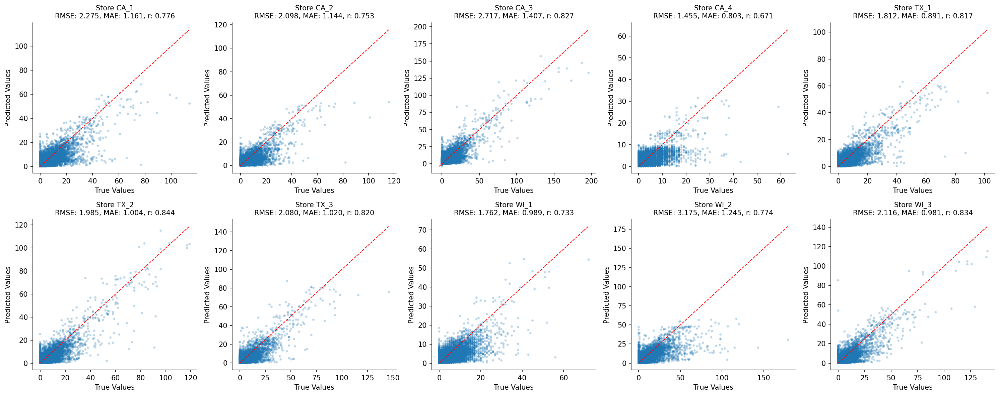

In [ ]:
# ============================================================================
# CREATE COMBINED REGRESSION PLOT (2x5 grid for 10 stores)
# ============================================================================

from scipy.stats import mean_squared_error, mean_absolute_error, pearsonr

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# Get store names in sorted order
store_names = sorted(all_val_preds.keys())

for idx, store in enumerate(store_names):
    ax = axes[idx]

    y_true = all_val_true[store]
    y_pred = all_val_preds[store]

    # Scatter plot
    ax.scatter(y_true, y_pred, alpha=0.3, s=10, edgecolors='none')

    # Perfect prediction line
    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    corr, _ = pearsonr(y_true, y_pred)

    # Customize subplot
    ax.set_xlabel('True Values', fontsize=10)
    ax.set_ylabel('Predicted Values', fontsize=10)
    ax.set_title(f'Store {store}\nRMSE: {rmse:.3f}, MAE: {mae:.3f}, r: {corr:.3f}', fontsize=10)
    # ax.legend(loc='upper left', fontsize=8)

plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
# ============================================================================
# PRINT SUMMARY STATISTICS
# ============================================================================
print('\n' + '='*70)
print('STORE-WISE VALIDATION PERFORMANCE')
print('='*70)

summary_stats = []
for store in store_names:
    y_true = all_val_true[store]
    y_pred = all_val_preds[store]

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)

    summary_stats.append({
        'Store': store,
        'RMSE': rmse,
        'MAE': mae,
        'N_samples': len(y_true)
    })

summary_df = pd.DataFrame(summary_stats)
display(summary_df)

print(f'\nMean RMSE across stores: {summary_df["RMSE"].mean():.4f}')
print(f'Mean MAE across stores: {summary_df["MAE"].mean():.4f}')
print(f"Overall Validation RMSE is {np.sqrt(val_mse/count):.4f}")


STORE-WISE VALIDATION PERFORMANCE


,Store,RMSE,MAE,N_samples
0,CA_1,2.274800,1.160923,85372
1,CA_2,2.097916,1.144435,85372
2,CA_3,2.716533,1.407110,85372
3,CA_4,1.455395,0.802992,85372
4,TX_1,1.812348,0.890987,85372
5,TX_2,1.984958,1.004462,85372
6,TX_3,2.080028,1.020074,85372
7,WI_1,1.761806,0.989113,85372
8,WI_2,3.174602,1.245109,85372
9,WI_3,2.115825,0.980731,85372



Mean RMSE across stores: 2.1474
Mean MAE across stores: 1.0646
Overall Validation RMSE is 2.1158


### feature importance

In [ ]:
def display_importances(feature_importance_df_, model_type=None):
    """Display top 20 most important features across all stores"""
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(
        by="importance", ascending=False)[:20].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]

    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature",
                data=best_features.sort_values(by="importance", ascending=False))
    plt.title(f'{model_type} Features (averaged over store predictions)')
    plt.xlabel('Importance', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.tight_layout()
    plt.show()

In [ ]:
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,number,date,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,number_lag_29,number_lag_30,number_lag_31,number_lag_32,number_lag_33,number_lag_34,number_lag_35,number_lag_50,number_lag_60,state_mean,store_mean,item_id_mean,item_state_mean,item_store_mean,state_median,store_median,item_id_median,item_state_median,item_store_median
1798910,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,8.26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.216553,0.335938,0.321533,0.0,0.0,0.0,0.0,0.0
1798911,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,3.97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.259766,0.204346,0.253906,0.0,0.0,0.0,0.0,0.0
1798912,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,2.97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.076660,0.098938,0.156982,0.0,0.0,0.0,0.0,0.0
1798913,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,60,3,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,4.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,2.011719,2.935547,1.694336,0.0,0.0,1.0,2.0,1.0
1798914,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,60,0,2011-03-29,4,3,2011,NaN,NaN,NaN,NaN,0,0,0,2.98,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.215820,1.304688,0.755371,0.968750,0.958984,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.98,1.0,0.0,0.0,1.0,1.0,0.0,3.0,0.0,0.0,1.027344,1.089844,0.797852,0.492432,0.528320,0.0,0.0,0.0,0.0,0.0
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.48,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.027344,1.089844,0.430176,0.363525,0.369629,0.0,0.0,0.0,0.0,0.0
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.98,0.0,1.0,0.0,1.0,0.0,2.0,1.0,2.0,1.0,1.027344,1.089844,0.704102,0.630371,0.880859,0.0,0.0,0.0,0.0,0.0
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,2,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.28,1.0,1.0,1.0,0.0,6.0,4.0,1.0,1.0,1.0,1.027344,1.089844,0.637207,0.583008,0.375244,0.0,0.0,0.0,0.0,0.0


In [ ]:
features = [f for f in df.columns if f != 'sold']
features

['id',
 'item_id',
 'dept_id',
 'cat_id',
 'store_id',
 'state_id',
 'd',
 'number',
 'date',
 'wday',
 'month',
 'year',
 'event_name_1',
 'event_type_1',
 'event_name_2',
 'event_type_2',
 'snap_CA',
 'snap_TX',
 'snap_WI',
 'sell_price',
 'number_lag_29',
 'number_lag_30',
 'number_lag_31',
 'number_lag_32',
 'number_lag_33',
 'number_lag_34',
 'number_lag_35',
 'number_lag_50',
 'number_lag_60',
 'state_mean',
 'store_mean',
 'item_id_mean',
 'item_state_mean',
 'item_store_mean',
 'state_median',
 'store_median',
 'item_id_median',
 'item_state_median',
 'item_store_median']

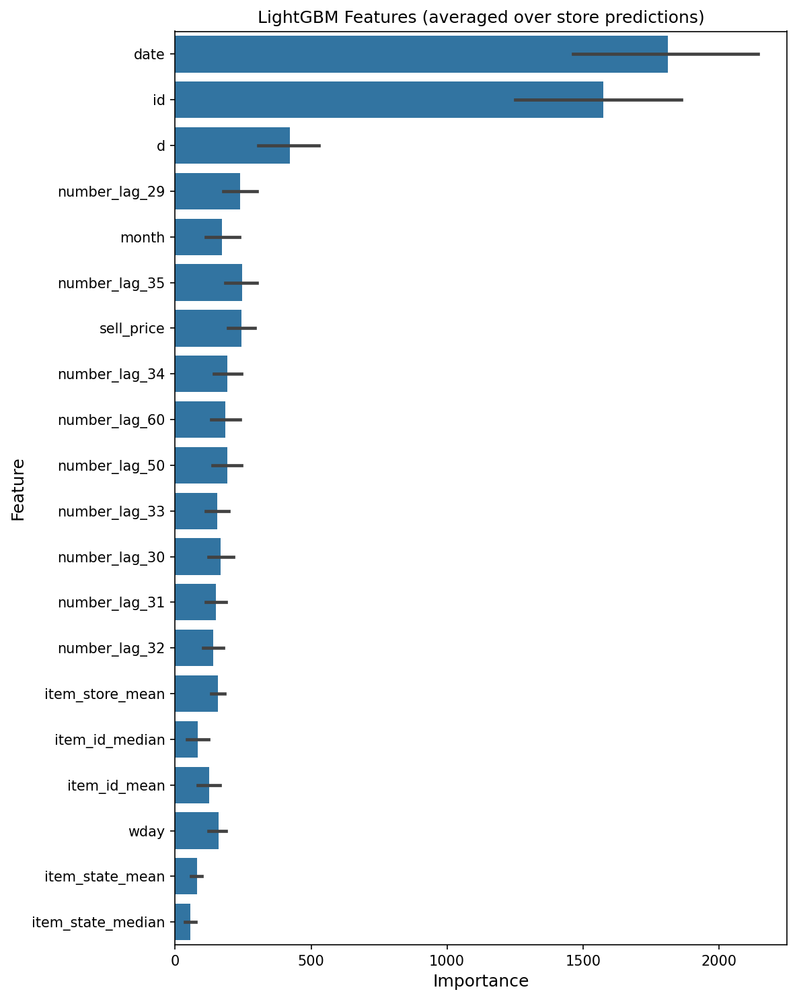

In [ ]:
# Get the actual feature names from the trained model
feature_importance_df = pd.DataFrame()
for filename in os.listdir('models'):
    if filename.startswith('lgbm') and filename.endswith('.pkl'):
        # Load model with full path
        filepath = os.path.join('models', filename)
        model = joblib.load(filepath)

        # Get feature names directly from the model
        feature_names = model.feature_name_

        store_importance_df = pd.DataFrame()
        store_importance_df["feature"] = feature_names
        store_importance_df["importance"] = model.feature_importances_
        store_importance_df["store"] = filename.split('_')[2].split('.')[0]  # Extract store name more robustly
        feature_importance_df = pd.concat([feature_importance_df, store_importance_df], axis=0)

display_importances(feature_importance_df, model_type='LightGBM')

### submission data

In [ ]:
def handle_format(results, is_val):
    wide_results = []
    for result in results:
        wide_df = result.pivot(index='id', columns='d', values='pred').reset_index()
        wide_results.append(wide_df)
    combined_df = pd.concat(wide_results, ignore_index=True)
    combined_df.columns = ['id']+[f'F{i+1}' for i in range(28)]
    if is_val:
        combined_df['id'] = combined_df['id'].str.replace('evaluation', 'validation')
    return combined_df

In [ ]:
eval_submission = handle_format(eval_results, False)
val_submission = handle_format(val_results, True)
final_submission = pd.concat([eval_submission, val_submission], ignore_index=True)
final_submission

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15,F16,F17,F18,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_evaluation,0.645154,0.556590,0.653043,0.577353,0.598997,0.488433,0.717909,0.826828,0.656526,0.604331,0.698671,0.780481,1.166008,1.168973,0.597897,0.562303,0.672033,0.692953,0.763927,0.855755,1.043162,0.877305,0.615311,0.504344,0.475037,0.878624,1.167099,0.929321
1,HOBBIES_1_002_CA_1_evaluation,0.227925,0.200040,0.260014,0.200241,0.277841,0.268387,0.266932,0.177498,0.179132,0.119365,0.220599,0.225371,0.291060,0.279526,0.196928,0.169042,0.190271,0.211662,0.175493,0.187201,0.293678,0.346255,0.397655,0.460965,0.405755,0.459633,0.554475,0.550298
2,HOBBIES_1_003_CA_1_evaluation,0.452476,0.425629,0.384042,0.319656,0.435415,0.423201,0.523236,0.430573,0.345780,0.408315,0.410759,0.435662,0.587334,0.520981,0.568214,0.461248,0.411292,0.491803,0.557326,0.538659,0.591664,0.434820,0.359895,0.345387,0.366786,0.459392,0.644534,0.783007
3,HOBBIES_1_004_CA_1_evaluation,2.188066,1.279852,1.303852,1.605791,1.633110,2.832303,2.411130,1.773556,1.826150,1.594798,1.779573,1.613295,2.600041,2.711127,2.003857,1.671954,1.536151,1.532316,1.738801,2.673799,2.851557,1.346372,1.488400,1.110156,1.444766,1.612879,2.066403,2.363714
4,HOBBIES_1_005_CA_1_evaluation,1.305557,1.217493,1.167231,1.149622,1.327369,1.700101,1.738922,1.219413,1.102006,1.253480,1.211783,1.222501,1.681481,1.655540,1.372587,1.217894,1.220649,1.219964,1.377223,1.620652,1.536059,1.177008,1.049837,0.949514,0.923627,0.739376,1.108040,1.060502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60975,FOODS_3_823_WI_3_validation,0.280828,0.327191,0.214881,0.327191,0.254080,0.290240,0.358870,0.264601,0.262048,0.288738,0.312942,0.352141,0.292219,0.379118,0.266579,0.423267,0.379467,0.379243,0.359234,0.675274,0.577108,0.417356,0.318057,0.342505,0.336785,0.455377,0.353669,0.328644
60976,FOODS_3_824_WI_3_validation,0.177634,0.173103,0.173103,0.173103,0.212302,0.248462,0.345066,0.398775,0.483395,0.355287,0.414783,0.479022,0.505377,0.563793,0.463909,0.355163,0.474411,0.453317,0.400256,0.530597,0.473050,0.281851,0.225154,0.173103,0.173103,0.212302,0.248462,0.373466
60977,FOODS_3_825_WI_3_validation,0.853150,0.657948,0.700450,0.668440,0.771113,0.758291,0.890100,0.862978,0.973677,0.850661,1.156143,1.057596,1.249852,1.399094,1.178658,1.364892,1.173361,0.919396,0.846619,1.439239,1.267032,0.938051,0.884333,0.643527,0.771436,0.868044,0.816762,0.738704
60978,FOODS_3_826_WI_3_validation,0.723207,0.745687,0.783147,0.758532,0.860578,0.869577,0.869749,0.737073,0.452135,0.597840,0.653456,0.693839,0.719039,0.812426,0.718838,0.625146,0.669444,0.803130,0.639818,0.927886,0.885548,0.645021,0.622705,0.480003,0.526782,0.416488,0.649695,0.741766


In [ ]:
final_submission.to_csv('submission.csv', index=False)